In [1]:
import numpy as np
import h5py

#Dans Files on met l'ensemble des données des 7 expériences
#Dans Datasets on mets l'ensemble des données d'acquisitions (ECG, EDA, Respiration Rate et Acceleration)
Files = []
Datasets = []
for i in range(1,8):
    if i==1:
        Files.append(h5py.File('./Correlation_stress_datasets/1st_stress.h5', 'r'))
    elif i==2:
        Files.append(h5py.File('./Correlation_stress_datasets/2nd_stress.h5', 'r'))
    elif i==3:
        Files.append(h5py.File('./Correlation_stress_datasets/3rd_stress.h5', 'r'))
    else:
        Files.append(h5py.File(f'./Correlation_stress_datasets/{i}th_stress.h5', 'r'))
for el in Files:
    Datasets.append(el['00:07:80:0F:80:1A']['raw'])

#Le header du fichier 1st_stress.h5 qui donnne des informations supplémentaires
h1 = {"00:07:80:0F:80:1A": {"position": 0, "device": "biosignalsplux", "device name": "00:07:80:0F:80:1A", "device connection": "/dev/tty.biosignalsplux-Bluetoot", "sampling rate": 1000, "resolution": [16, 16, 16, 16], "firmware version": 775, "comments": "", "keywords": "", "mode": 0, "sync interval": 2, "date": "2020-12-14", "time": "12:53:59.523", "channels": [1, 2, 3, 4], "sensor": ["EGG", "EDA", "RESPIRATION", "XYZ"], "label": ["CH1", "CH2", "CH3", "CH4"], "column": ["nSeq", "DI", "CH1", "CH2", "CH3", "CH4"], "special": [{"SpO2": [80, 40, 5, 4, 3, 3]}, {"SpO2": [80, 40, 5, 4, 3, 3]}, {"SpO2": [80, 40, 5, 4, 3, 3]}, {"SpO2": [80, 40, 5, 4, 3, 3]}, {"SpO2": [80, 40, 5, 4, 3, 3]}, {"SpO2": [80, 40, 5, 4, 3, 3]}, {"SpO2": [80, 40, 5, 4, 3, 3]}, {"SpO2": [80, 40, 5, 4, 3, 3]}], "digital IO": [0, 1], "sleeve color": ["", "", "", ""]}}



In [2]:
#Deux fonctions permettants d'afficher lla structures des données. Elles sont similaires mais comme on ne peut pas distinguer un Groupe HDF d'un Dataset, on doit adapter les scripts.
def afficheLabels():
    for key in dset1.keys():
        print(key)
        print(f'{list(dset1[key].keys())}')
        for subkey in dset1[key].keys():
            print(f'{dset1[key][subkey]} \n')
#afficheLabels()

def afficheLabelsSupport():
    l = 'support'
    for key in dset1['support'].keys():
        print(key)
        print(f'{dset1[l][key].keys()} \n')
        for subkey in dset1[l][key].keys():
            print(f'{dset1[l][key][subkey]} \n')
            for subsubkey in dset1[l][key][subkey].keys():
                print(f'{dset1[l][key][subkey][subsubkey]} \n')
#afficheLabelsSupport()
data = Files[0]['00:07:80:0F:80:1A']['support']['level_1000']['channel_1']['Mx']

# Architecture des données
Les fichiers x_stress.h5 sont organisé de la manière suivante
* Le nom de l'appareil '00:07:80:0F:80:1A'
    * digital : 
        * digital_1 : Grande liste de 0
    * events
        * digital : Un tableau [2,0,0,0] correspondant à la durée de l'intervalle de synchronisation
        * sync : Un tableau vide
    * plugin : Un groupe avec des Datasets vides 
    * raw :
        * channel_1 : Un tableau de 330600 entrées correspondant aux valeurs de l'ECG
        * channel_2 : Un tableau de 330600 entrées correspondant aux valeurs de l'EDA
        * channel_3 : Un tableau de 330600 entrées correspondant aux valeurs du taux de respiration
        * channel_4 : Un tableau de 330600 entrées correspondant aux valeurs de l'accéleromètre
        * nSeq : Un tableau de 0 à 330599 correspondant à l'échantillonnage
    * support : 
        * level_10 :
            * channel_1 : 
                * Mx : 
                * mean : 
                * mean_x2 : 
                * mx : 
                * sd :
                * t : 
            * channel_2 : Idem
            * channel_3 : Idem
            * channel_4 : Idem
            * dig_channel_1 :
        * level_100 : Idem avec une taille de 3306
        * level_1000 : Idem avec une taille de 330

# Conclusion
Les données à traiter se trouvent dans '/00:07:80:0F:80:1A/raw' et '/00:07:80:0F:80:1A/support/level_x' qu'ils faut examiner

In [4]:
#Fonction qui récupère les données ECG, EDA, RR et ACC de Dataset afin de les plots dans la deuxième fonction. Le paramètre nous sert à définir la taille des données que l'on veut
import matplotlib.pyplot as plt

def collectData(i):
    data_ecg, data_eda, data_rr, data_acc = [], [],[],[]
    for j in range(len(Datasets)):
        data_ecg.append(Datasets[j]['channel_1'][:i])
        data_eda.append(Datasets[j]['channel_2'][:i])
        data_rr.append(Datasets[j]['channel_3'][:i])
        data_acc.append(Datasets[j]['channel_4'][:i])
    return [data_ecg, data_eda, data_rr, data_acc]

dataplot = collectData(-1)

#Fonction pour ploter les données, on sauvegarde 7 images rawdatasX.png comprenant les 4 graphiques différents
def plotDatas(data_):
    for j in range(len(Datasets)):
        i = 1
        label = ['ECG', 'EDA', 'RR', 'ACC']
        fig = plt.figure(figsize=(60,20))
        for el in data_:
            plt.subplot(2,2,i)
            plt.plot(el[j])
            plt.title(f'Raw {label[i-1]} Acquisition')
            plt.xlabel('Acquistition')
            plt.ylabel(f'{label[i-1]} Value')
            plt.legend()
            print(i)
            i += 1
        plt.show()
        fig.savefig(f'rawdatas{j+1}.png')

#plotDatas(dataplot)

# Data cleaning 
using sklearn

In [6]:
def displayChannels(data_, data_name):
    Fs = 1000
    label = ['ECG', 'EDA', 'RR', 'ACC']
    fig = plt.figure(figsize=(60,20), facecolor="white")
    for nplot in range(4):
        plt.subplot(4,1,nplot+1)
        plt.plot(data_[nplot][50*Fs:87*Fs]) #intervalle du premier artefact sur le patient n°1 en sec
        plt.title(f'Raw {label[nplot]} Acquisition')
        plt.xlabel('Acquistition')
        plt.ylabel(f'{label[nplot]} Value')
        plt.legend()
    plt.savefig('graph_{}.png'.format(data_name))
    #plt.show()

In [8]:
!pip install heartpy
import heartpy, scipy

def applyFilter(data_):
#must be a (4, _) array
    Fs = 1000.0
    data_[0] = heartpy.filtering.filter_signal(np.ravel(data_[0]), cutoff = 0.01, sample_rate = Fs, filtertype = 'notch')
    data_[0] = scipy.stats.zscore(data_[0])

Defaulting to user installation because normal site-packages is not writeable


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


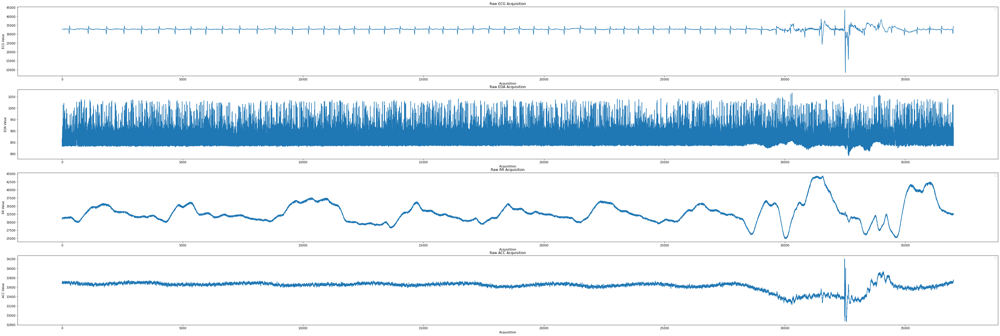

In [36]:
len(dataplot[0][0])
X_raw = np.array([dataplot[0][0],dataplot[1][0],dataplot[2][0],dataplot[3][0]]).reshape(4,330599)
displayChannels(X_raw, 'raw')


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


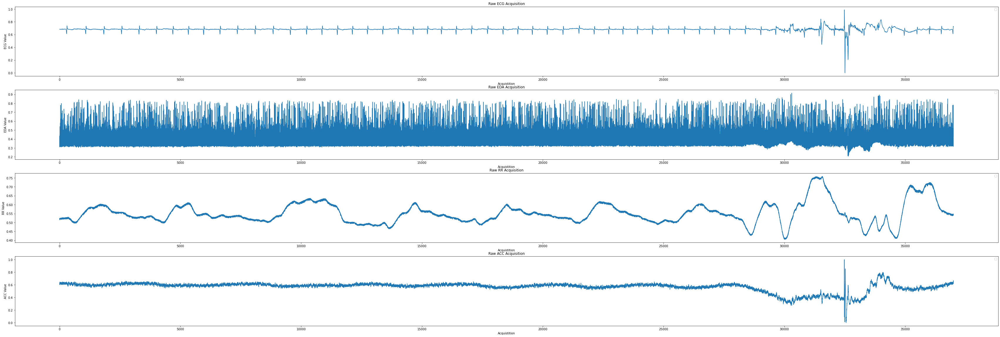

In [37]:
from sklearn import preprocessing 

scaling = preprocessing.MinMaxScaler()
X_std = np.array([  scaling.fit_transform(X_raw[0].reshape(-1, 1)),
                    scaling.fit_transform(X_raw[1].reshape(-1, 1)),
                    scaling.fit_transform(X_raw[2].reshape(-1, 1)),
                    scaling.fit_transform(X_raw[3].reshape(-1, 1))])
X_std = np.squeeze(X_std)
displayChannels(X_std, 'std')

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


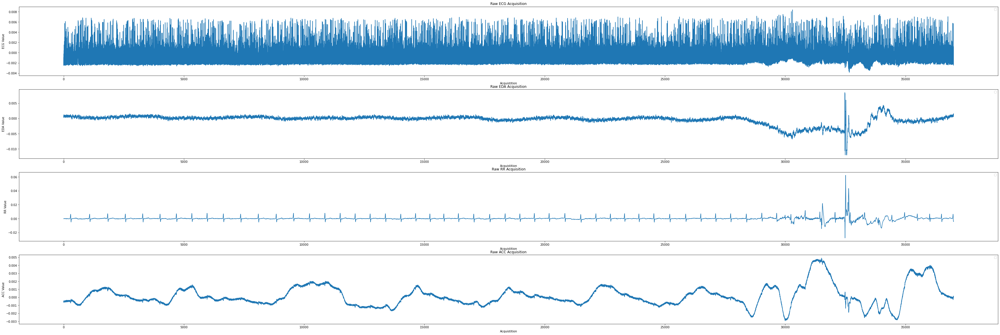

In [20]:
from sklearn.datasets import load_digits
from sklearn.decomposition import FastICA

ica = FastICA(n_components=4, random_state=0)
X_ica = ica.fit_transform(X_std.T)
displayChannels(X_ica.T, 'ica')

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
(330599, 4)


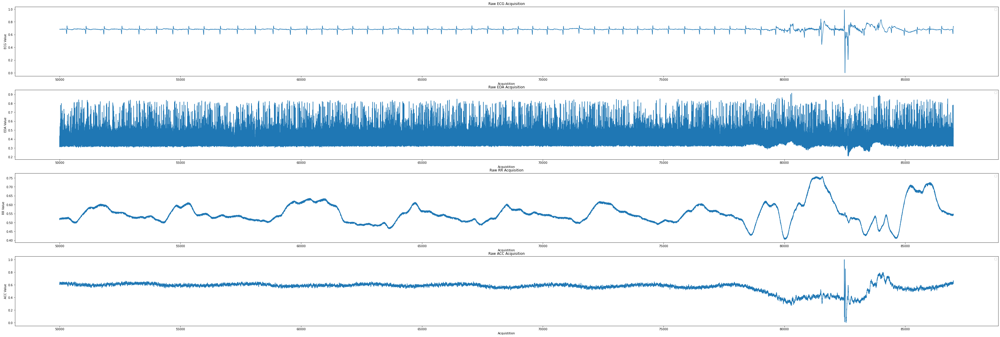

In [73]:
X_dns = pd.DataFrame(data=X_std.T)
X_dns.rolling(100, win_type='gaussian').mean(std=X_dns.std().mean())

print(X_dns.shape)
displayChannels(X_dns, 'denoise')

In [22]:
from sklearn.neighbors import KNeighborsRegressor
import pandas as pd

clf = KNeighborsRegressor(n_neighbors=100, weights='uniform')
clf.fit(X_std[0], X_std[0])
y_pred = clf.predict(X_std[0])
pd.Series(y_pred).plot(figsize=(12, 8))

ValueError: Expected 2D array, got 1D array instead:
array=[0.6826354  0.68319375 0.68389168 ... 0.68274707 0.68230039 0.68143495].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

<Figure size 4320x1440 with 0 Axes>

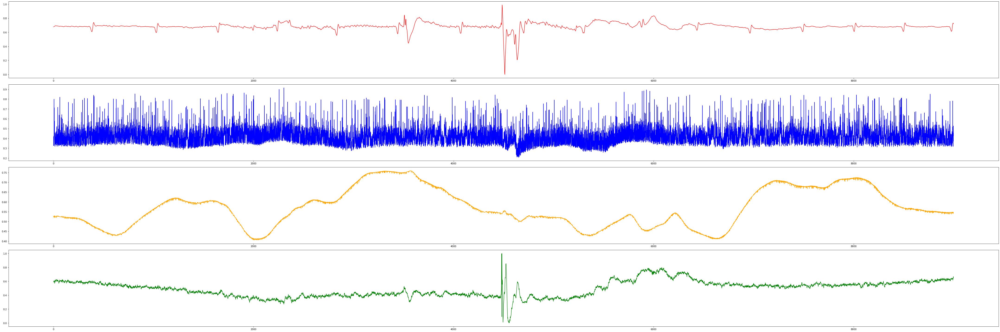

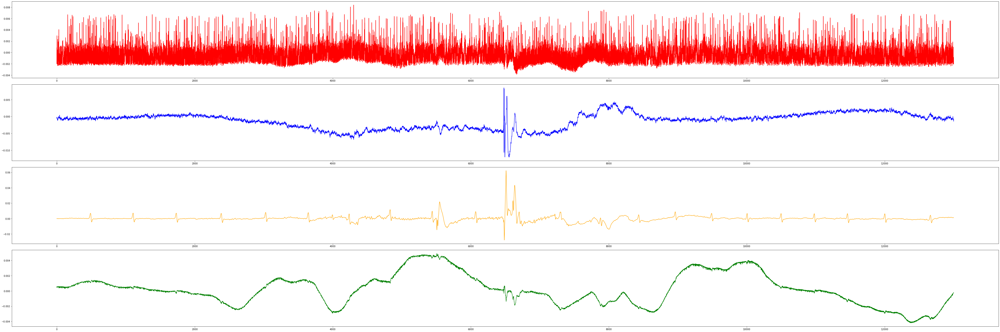

In [101]:
from sklearn.decomposition import FastICA

Fs = 1000
np.random.seed(0)
n_samples = 330599
time = np.linspace(0, 4, n_samples)

S = X_std.T #(330599, 4)
S = np.vectorize(lambda x: np.float(x))(S) #(n_sample, n_channels)
#S += 0.2 * np.random.normal(size=S.shape)
#S /= S.std(axis=0)

ica = FastICA(n_components=4)
S_ = ica.fit_transform(S)
fig = plt.figure(figsize=(60,20))
models = [X_std.T[78*Fs:87*Fs], S_[76*Fs:89*Fs]]
names = ['real sources', 'predicted sources']
colors = ['red', 'blue', 'orange', 'green']
for i, (name, model) in enumerate(zip(names, models)):
    fig = plt.figure(figsize=(60,20))
    
    plt.title(name)
    j = 0
    for sig, color in zip (model.T, colors):
        plt.subplot(4, 1, j+1)
        plt.plot(sig, color=color)
        j += 1

    fig.tight_layout()  
    plt.savefig('graph_ica+{}.png'.format(name))